# Code Notebook for Student Performance Dataset

This notebook contains the code for EDA and building Bayesian models. For a complete discussion of the analysis look at the accompanying report.

In [213]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pymc as pm
import numpy as np
import arviz as az


In [214]:
# Load the input file and display the first few rows
df = pd.read_csv('../data/StudentsPerformance.csv')
df.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [215]:
# Rename some of the columns to make them easier to work with and read
df.rename(columns={'race/ethnicity': 'demographics',
                   'parental level of education': 'parent_edu_level',
                   'test preparation course': 'test_prep',
                   'math score': 'math',
                   'reading score': 'reading',
                   'writing score': 'writing'},
                   inplace=True)
df.head()

,gender,demographics,parent_edu_level,lunch,test_prep,math,reading,writing
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [216]:
df.shape

(1000, 8)

We have 1,000 student records, with 8 variables.

Look at the categorical data for the different values to see what we have to work with.

In [217]:
# how many groups?
df['demographics'].value_counts()

demographics
group C    319
group D    262
group B    190
group E    140
group A     89
Name: count, dtype: int64

In [218]:
# how many unique types of parent education?
df['parent_edu_level'].value_counts()

parent_edu_level
some college          226
associate's degree    222
high school           196
some high school      179
bachelor's degree     118
master's degree        59
Name: count, dtype: int64

In [219]:
# how many lunch types?
df['lunch'].value_counts()  

lunch
standard        645
free/reduced    355
Name: count, dtype: int64

In [220]:
# how many test prep types?
df['test_prep'].value_counts()

test_prep
none         642
completed    358
Name: count, dtype: int64

In [221]:
# check for missing values
df.isna().sum()

gender              0
demographics        0
parent_edu_level    0
lunch               0
test_prep           0
math                0
reading             0
writing             0
dtype: int64

In [222]:
df.describe()

,math,reading,writing
count,1000.00000,1000.000000,1000.000000
mean,66.08900,69.169000,68.054000
std,15.16308,14.600192,15.195657
min,0.00000,17.000000,10.000000
25%,57.00000,59.000000,57.750000
50%,66.00000,70.000000,69.000000
75%,77.00000,79.000000,79.000000
max,100.00000,100.000000,100.000000


# Analysis

Distribution of test scores by subject.

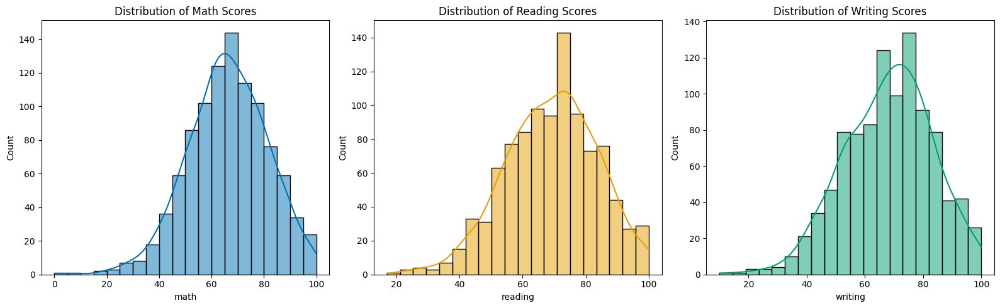

In [223]:
# Distribution of scores in each subject
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.histplot(df['math'], kde=True, bins=20, color='#0072B2')
plt.title('Distribution of Math Scores')

plt.subplot(1, 3, 2)
sns.histplot(df['reading'], kde=True, bins=20, color='#E69F00')
plt.title('Distribution of Reading Scores')

plt.subplot(1, 3, 3)
sns.histplot(df['writing'], kde=True, bins=20, color='#009E73')
plt.title('Distribution of Writing Scores')

plt.tight_layout()
plt.show()

The histograms show the distribution of test scores is fairly normal, and follow a normal distribution. There are some outliers in math and writing.

### Distribution of test scores based on if test prep was used.

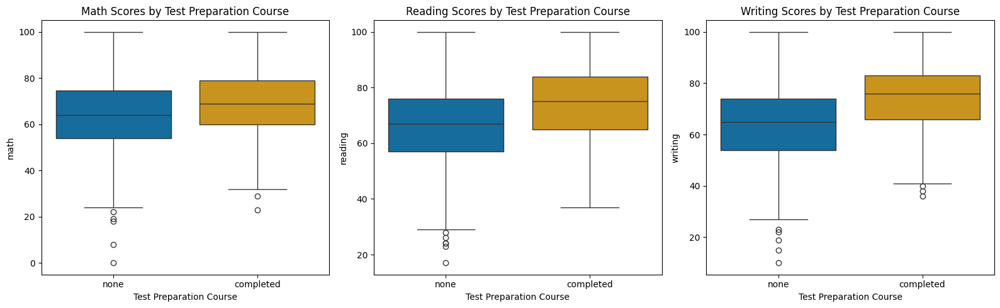

In [224]:
test_color_palette = {
    'none': '#0072B2',    # Blue
    'completed': '#E69F00',  # Orange
}

# Distribution of scores by test preparation course
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x='test_prep', y='math', data=df, palette=test_color_palette, hue='test_prep', legend=False).set_xlabel('Test Preparation Course')
plt.title('Math Scores by Test Preparation Course')

plt.subplot(1, 3, 2)
sns.boxplot(x='test_prep', y='reading', data=df, palette=test_color_palette, hue='test_prep', legend=False).set_xlabel('Test Preparation Course')
plt.title('Reading Scores by Test Preparation Course')

plt.subplot(1, 3, 3)
sns.boxplot(x='test_prep', y='writing', data=df, palette=test_color_palette, hue='test_prep', legend=False).set_xlabel('Test Preparation Course')
plt.title('Writing Scores by Test Preparation Course')

plt.tight_layout()
plt.show()

The boxplots suggest students who completed a test prep course have higher scores in all three subjects. This indicates the courses likely help to improve scores.

### Distribution of test scores by gender

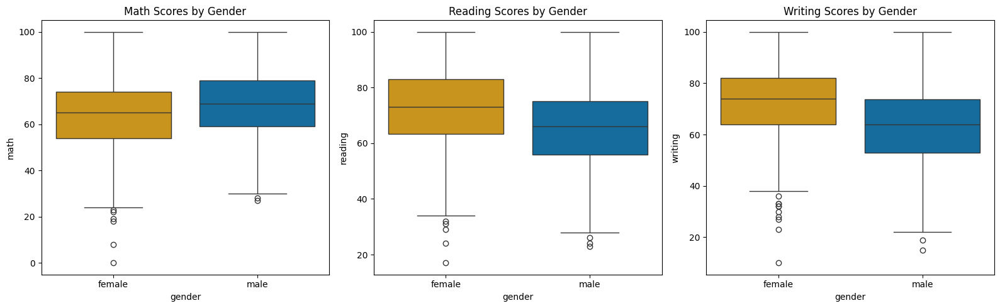

In [225]:
gender_color_palette = {
    'male': '#0072B2',    # Blue
    'female': '#E69F00',  # Orange
}
# Distribution of scores by gender
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x='gender', y='math', data=df, palette=gender_color_palette, hue='gender', legend=False)
plt.title('Math Scores by Gender')

plt.subplot(1, 3, 2)
sns.boxplot(x='gender', y='reading', data=df, palette=gender_color_palette, hue='gender', legend=False)
plt.title('Reading Scores by Gender')

plt.subplot(1, 3, 3)
sns.boxplot(x='gender', y='writing', data=df, palette=gender_color_palette, hue='gender', legend=False)
plt.title('Writing Scores by Gender')

plt.tight_layout()
plt.show()

The boxplots indicate females score better than males in reading and writing, while males score better in math.

### Distribution of test scores by socioeconomic status, as represented by free/reduced vs. standard lunch.

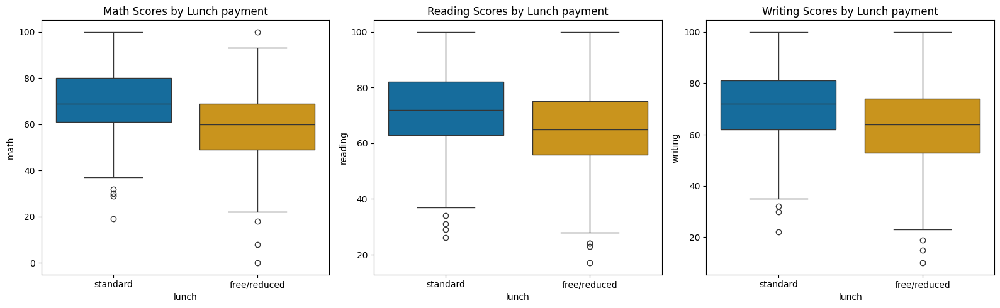

In [226]:
lunch_color_palette = {
    'standard': '#0072B2',    # Blue
    'free/reduced': '#E69F00',  # Orange
}
# Distribution of scores by lunch
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x='lunch', y='math', data=df, palette=lunch_color_palette, hue='lunch', legend=False)
plt.title('Math Scores by Lunch payment')

plt.subplot(1, 3, 2)
sns.boxplot(x='lunch', y='reading', data=df, palette=lunch_color_palette, hue='lunch', legend=False)
plt.title('Reading Scores by Lunch payment')

plt.subplot(1, 3, 3)
sns.boxplot(x='lunch', y='writing', data=df, palette=lunch_color_palette, hue='lunch', legend=False)
plt.title('Writing Scores by Lunch payment')

plt.tight_layout()
plt.show()

The boxplots suggest students who pay full price for lunch score higher in all three categories.

### Distribution of scores by parental education level

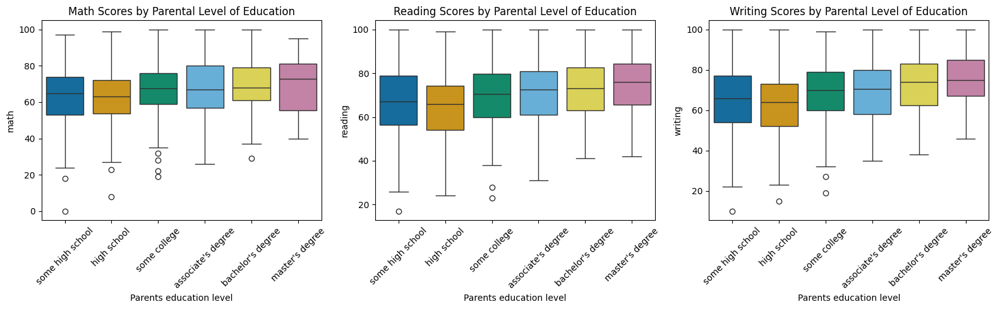

In [227]:
education_order = [
    'some high school',
    'high school',
    'some college',
    'associate\'s degree',
    'bachelor\'s degree',
    'master\'s degree'
]

color_palette = {
    'some high school': '#0072B2',    # Blue
    'high school': '#E69F00',         # Orange
    'some college': '#009E73',        # Green
    'associate\'s degree': '#56B4E9', # Light Blue
    'bachelor\'s degree': '#F0E442',  # Yellow
    'master\'s degree': '#CC79A7'     # Purple
}


plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x='parent_edu_level', y='math', data=df, order=education_order, palette=color_palette, hue='parent_edu_level', legend=False).set_xlabel('Parent''s education level')
plt.title('Math Scores by Parental Level of Education')
plt.xticks(rotation=45)

plt.subplot(1, 3, 2)
sns.boxplot(x='parent_edu_level', y='reading', data=df, order=education_order, palette=color_palette, hue='parent_edu_level', legend=False).set_xlabel('Parent''s education level')
plt.title('Reading Scores by Parental Level of Education')
plt.xticks(rotation=45)

plt.subplot(1, 3, 3)
sns.boxplot(x='parent_edu_level', y='writing', data=df, order=education_order, palette=color_palette, hue='parent_edu_level', legend=False).set_xlabel('Parent''s education level')
plt.title('Writing Scores by Parental Level of Education')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


The boxplots suggest that as a parent's education level increases, their student's scores increase.

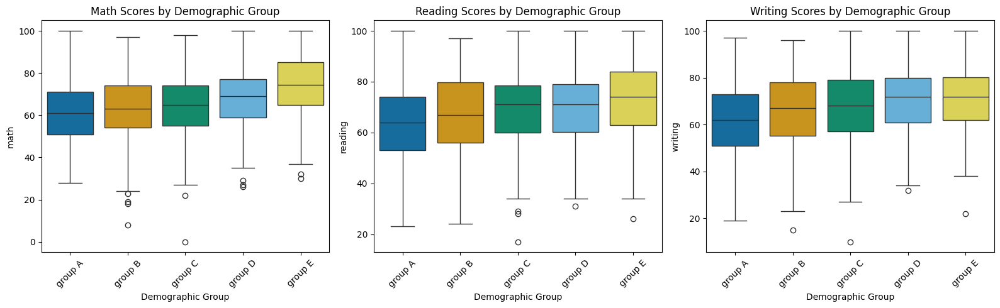

In [228]:
color_palette = {
    'group A': '#0072B2',    # Blue
    'group B': '#E69F00',         # Orange
    'group C': '#009E73',        # Green
    'group D': '#56B4E9', # Light Blue
    'group E': '#F0E442',  # Yellow

}

# Define the correct order of demographic groups
demographic_order = ['group A', 'group B', 'group C', 'group D', 'group E']

plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x='demographics', y='math', data=df, order=demographic_order, palette=color_palette, hue='demographics', legend=False).set_xlabel('Demographic Group')
plt.title('Math Scores by Demographic Group')
plt.xticks(rotation=45)

plt.subplot(1, 3, 2)
sns.boxplot(x='demographics', y='reading', data=df, order=demographic_order, palette=color_palette, hue='demographics', legend=False).set_xlabel('Demographic Group')
plt.title('Reading Scores by Demographic Group')
plt.xticks(rotation=45)

plt.subplot(1, 3, 3)
sns.boxplot(x='demographics', y='writing', data=df, order=demographic_order, palette=color_palette, hue='demographics', legend=False).set_xlabel('Demographic Group')
plt.title('Writing Scores by Demographic Group')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# paCe - CONSTRUCT

## Hypothesis #1 / Does Test Preparation Improve Test Scores?

Instead of asking *Is there a statistically significant difference in math scores between students who did and did not complete the test prep course?* we ask *What is the probability that completing the test prep course improves math scores? And by how much?*

### Bayesian analysis of test scores with/without test prep

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_completed, mu_no_prep, sigma_completed, sigma_no_prep]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [completed_obs, no_prep_obs]


Output()

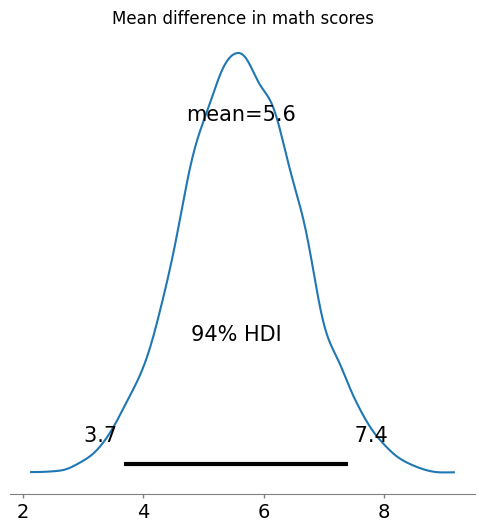

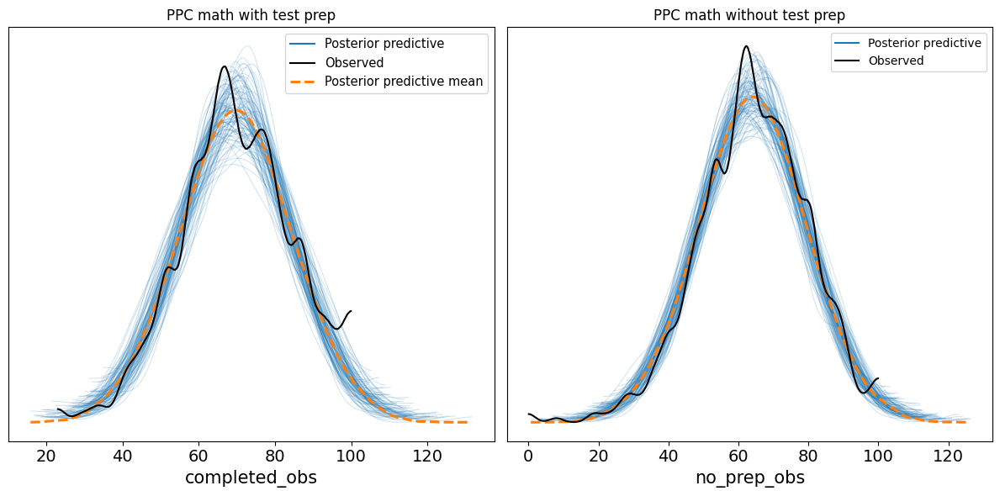

Trace for math:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/98571911.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

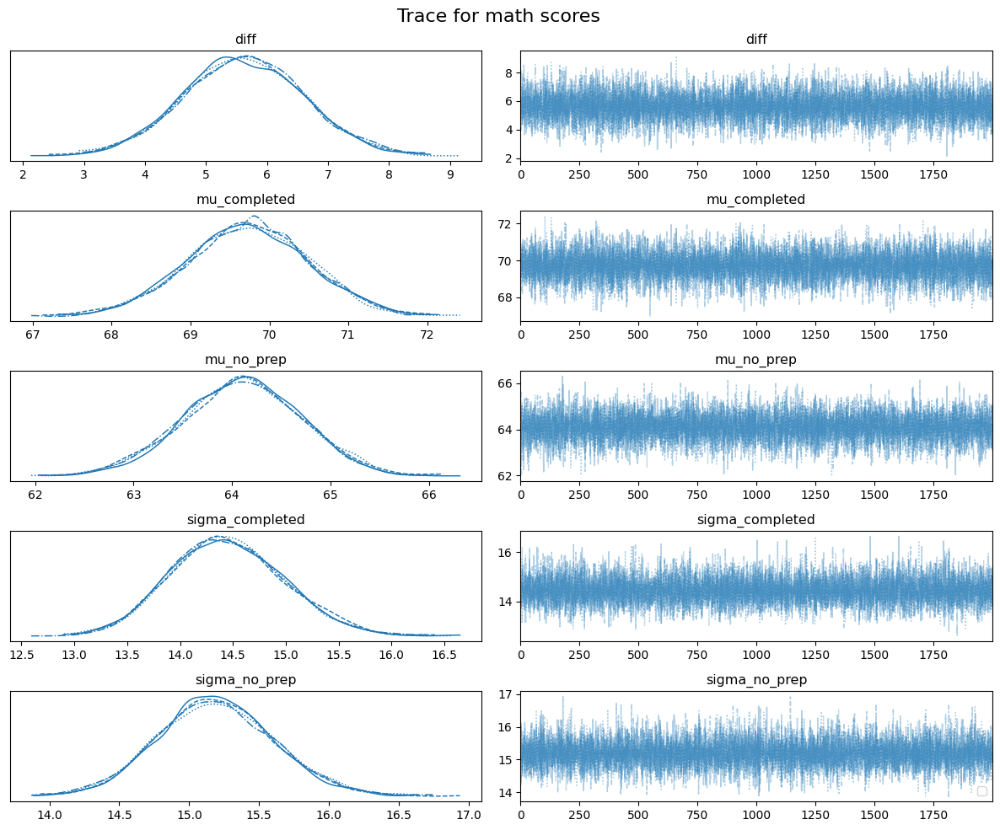

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_completed, mu_no_prep, sigma_completed, sigma_no_prep]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [completed_obs, no_prep_obs]


Output()

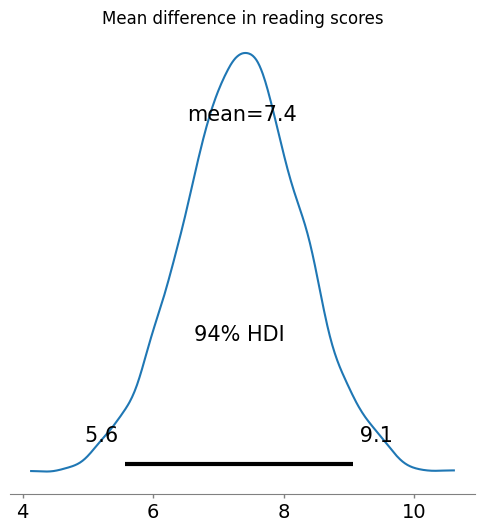

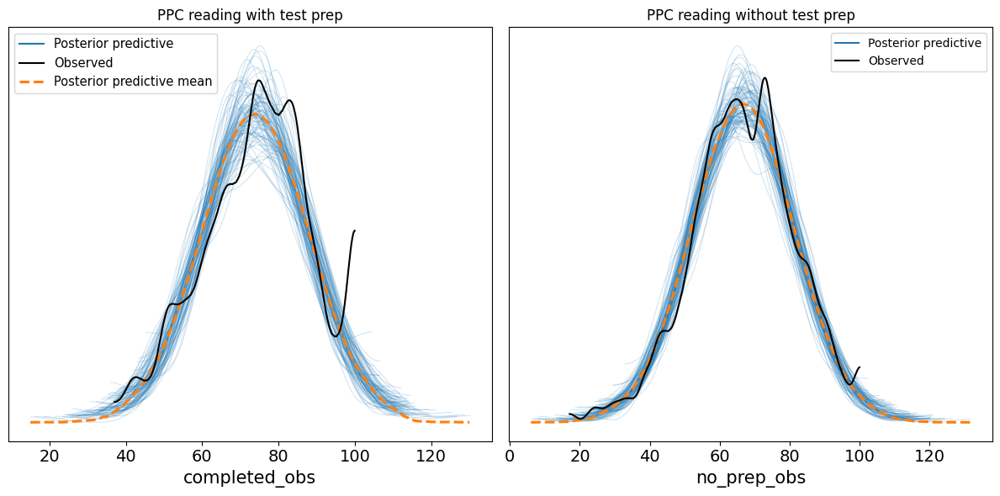

Trace for reading:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/98571911.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

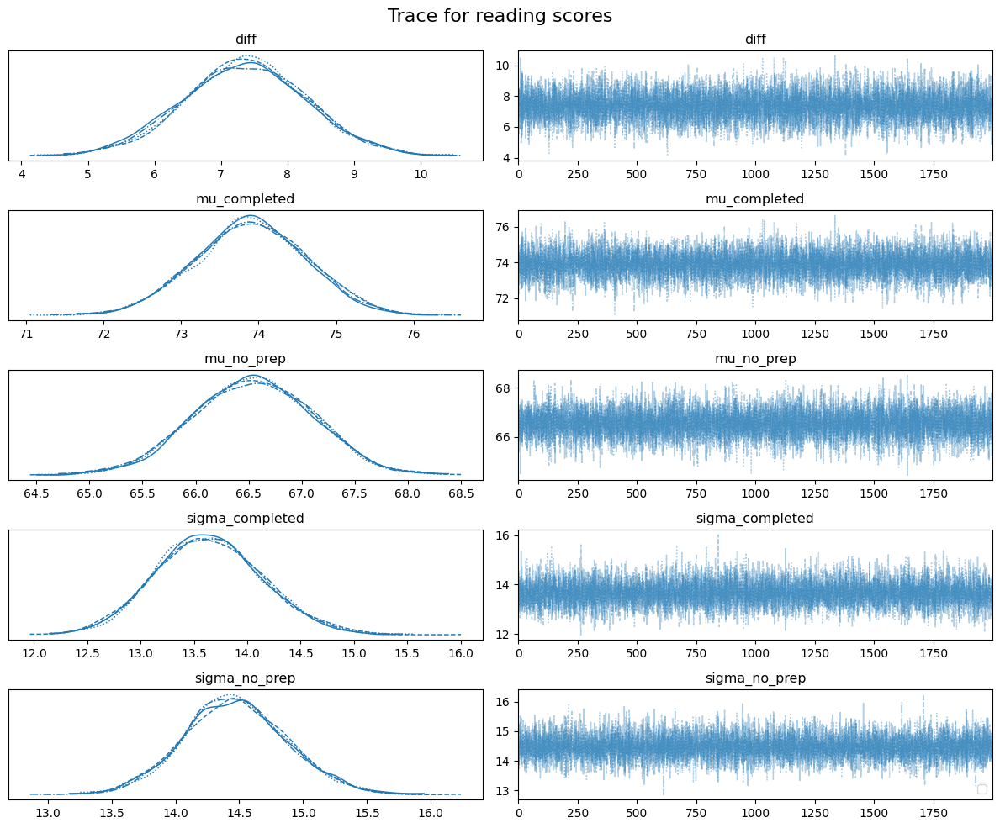

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_completed, mu_no_prep, sigma_completed, sigma_no_prep]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [completed_obs, no_prep_obs]


Output()

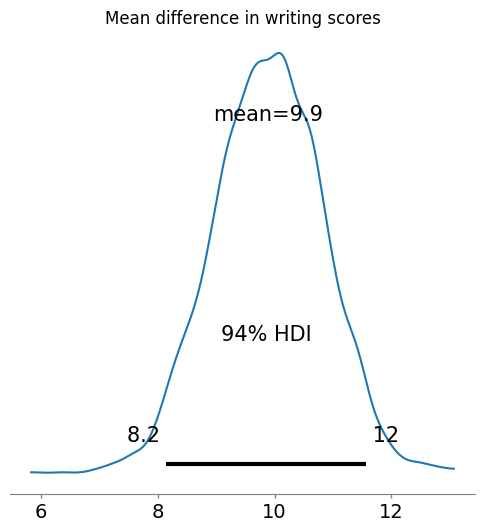

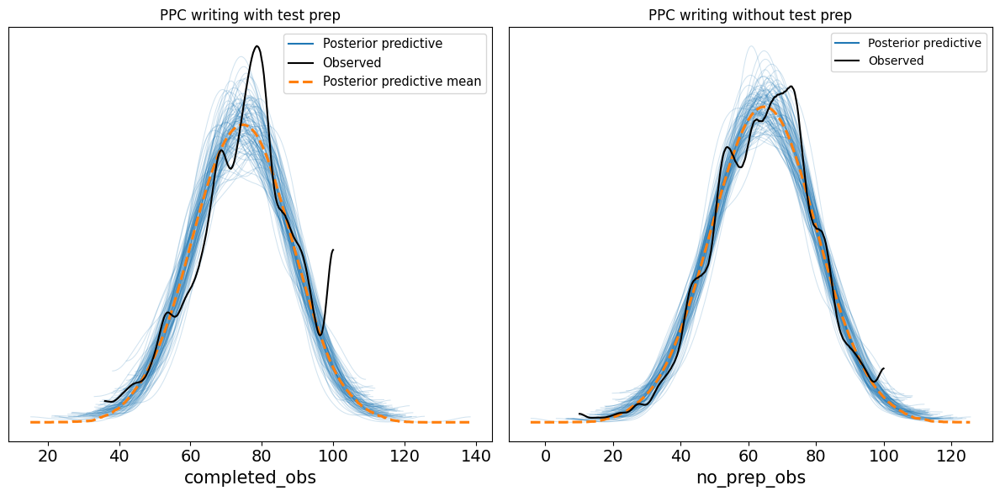

Trace for writing:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/98571911.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

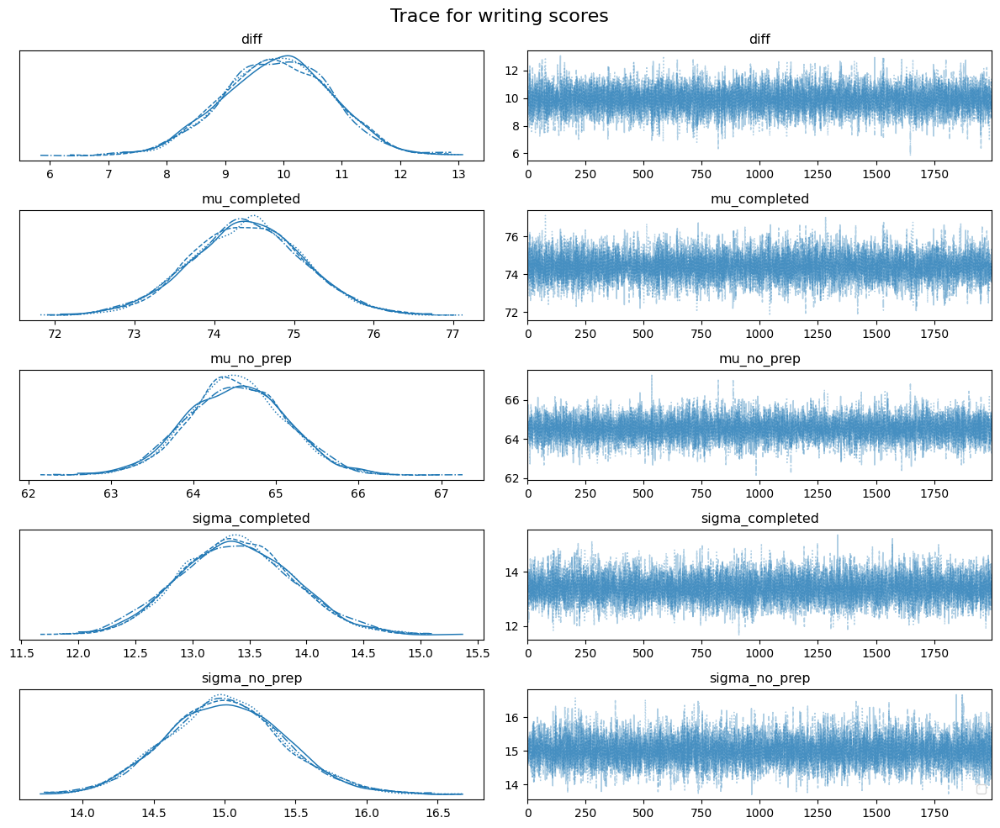

In [229]:
def compare_test_prep_to_test_scores(test_area):
    # Calculate summary statistics from the data
    mean_score_no_prep = 70  # average score for no test prep
    mean_score_completed = 75  # average score for completed test prep
    std_score = 10  # standard deviation of scores

    traces = {}

    #fig, axes = plt.subplots(2, 1, figsize=(12, 8))

    # Define the Bayesian model with dataset-informed priors
    with pm.Model() as model:
        
        # Prepare the data
        completed_scores = df[df['test_prep'] == 'completed'][test_area].values
        no_prep_scores = df[df['test_prep'] == 'none'][test_area].values
        
        # Priors for the means (centered around the overall mean)
        mu_completed = pm.Normal('mu_completed', mu=mean_score_completed, sigma=std_score)
        mu_no_prep = pm.Normal('mu_no_prep', mu=mean_score_no_prep, sigma=std_score)
        
        # Priors for the standard deviations (using the observed standard deviation)
        sigma_completed = pm.HalfNormal('sigma_completed', sigma=std_score)
        sigma_no_prep = pm.HalfNormal('sigma_no_prep', sigma=std_score)
        
        # Likelihood for the observed data
        completed_obs = pm.Normal('completed_obs', mu=mu_completed, sigma=sigma_completed, observed=completed_scores)
        no_prep_obs = pm.Normal('no_prep_obs', mu=mu_no_prep, sigma=sigma_no_prep, observed=no_prep_scores)
        
        # Calculate the difference in means
        diff = pm.Deterministic('diff', mu_completed - mu_no_prep)
        
        # Inference
        trace = pm.sample(2000, return_inferencedata=True)
        
        # Store the trace
        traces[test_area] = trace
        
        # Summarize the results
        summary = az.summary(trace, hdi_prob=0.95)
        #print(f'Summary for {test_area}:\n', summary)
        
        mean_diff = summary['mean']['mu_completed'] - summary['mean']['mu_no_prep']

        if mean_diff > 0:
            better_group = 'with test prep'
        else:
            better_group = 'without test prep'
        
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
        az.plot_posterior(trace, var_names=['diff'], ax=ax)
        ax.set_title(f'Mean difference in {test_area} scores')
        #ax[1].set_title(f'No test prep effect on {test_area} scores')
        # Plot the posterior distribution of the difference of the parameters in the model

        # Posterior Predictive Checks (PPCs)
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        ppc = pm.sample_posterior_predictive(trace, var_names=['completed_obs', 'no_prep_obs'])
        az.plot_ppc(ppc, num_pp_samples=100, ax=ax) 
        ax[0].set_title(f'PPC {test_area} with test prep')
        ax[1].set_title(f'PPC {test_area} without test prep')

    
    plt.tight_layout()
    plt.show()

    for target_column, trace in traces.items():
        print(f'Trace for {target_column}:\n')
        plt.figure()
        az.plot_trace(trace)
        
        # Move the legend to the bottom right
        plt.legend(loc='lower right')
        
        plt.suptitle(f'Trace for {target_column} scores', fontsize=16)
        plt.tight_layout()
        plt.show()

    return traces

# Example usage:
traces = compare_test_prep_to_test_scores('math')
traces = compare_test_prep_to_test_scores('reading')
traces = compare_test_prep_to_test_scores('writing')

Hooray! All trace plots look like 'fuzzy caterpillars'. That is the single best description that you'll never forget.

The posterior mean of 5.6 indicates that the model estimates the "completed prep" group to have a mean score that is 5.6 units higher than the "no prep" group. On average students who take the prep course score 5.6 points higher in math.

Since the credible interval [3.9, 7.5] does not include zero, the difference is statistically significant, and not due to random chance.

# Hypothesis #2 / Are There Gender-Based Performance Gaps?

The following code is for feature engineering to convert the input data to the format preferable for modeling.

In [251]:
# Define the correct order for the 'parent_edu_level' column
education_order = [
    'some high school',
    'high school',
    'some college',
    'associate\'s degree',
    'bachelor\'s degree',
    'master\'s degree'
]

# Map the ordered education levels to numeric values
df['parent_edu_code'] = df['parent_edu_level'].map({
    'some high school': 0,
    'high school': 1,
    'some college': 2,
    'associate\'s degree': 3,
    'bachelor\'s degree': 4,
    'master\'s degree': 5
})
# Create a mapping from numeric codes to education levels using the predefined order
parent_edu_mapping = {i: level for i, level in enumerate(education_order)}

# Reverse the encoding for test preparation course
# Now 1 means 'completed' and 0 means 'none'
df['test_prep_numeric'] = df['test_prep'].map({
    'none': 0,
    'completed': 1
})

# Convert other categorical variables to numerical (if necessary)
#df['gender_numeric'] = pd.Categorical(df['gender']).codes

df['lunch_numeric'] = df['lunch'].map({
    'free/reduced': 0,
    'standard': 1
})
df['gender_numeric'] = pd.Categorical(df['gender']).codes

# this was just easier since we have to back out this to the names way down in other code blocks.
df['demographic_code'] = df['demographics'].map({
    'group A': 0,
    'group B': 1,
    'group C': 2,
    'group D': 3,
    'group E': 4
})
demographic_mapping = dict(enumerate(pd.Categorical(df['demographics']).categories))


In [231]:
df.head(10)

,gender,demographics,parent_edu_level,lunch,test_prep,math,reading,writing,parent_edu_numeric,test_prep_numeric,lunch_numeric,gender_numeric,demographic_code
0,female,group B,bachelor's degree,standard,none,72,72,74,5,0,1,0,1
1,female,group C,some college,standard,completed,69,90,88,3,1,1,0,2
2,female,group B,master's degree,standard,none,90,95,93,6,0,1,0,1
3,male,group A,associate's degree,free/reduced,none,47,57,44,4,0,0,1,0
4,male,group C,some college,standard,none,76,78,75,3,0,1,1,2
5,female,group B,associate's degree,standard,none,71,83,78,4,0,1,0,1
6,female,group B,some college,standard,completed,88,95,92,3,1,1,0,1
7,male,group B,some college,free/reduced,none,40,43,39,3,0,0,1,1
8,male,group D,high school,free/reduced,completed,64,64,67,2,1,0,1,3
9,female,group B,high school,free/reduced,none,38,60,50,2,0,0,0,1


Note: Female = 0, Male = 1

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_gender, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [math]


Output()

              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
coef_gender  5.315  0.952     3.464      7.166      0.013    0.009    5168.0   

             ess_tail  r_hat  
coef_gender    5268.0    1.0  


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_gender, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [reading]


Output()

              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
coef_gender -6.788  0.885    -8.558     -5.072      0.014     0.01    4190.0   

             ess_tail  r_hat  
coef_gender    4890.0    1.0  


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_gender, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [writing]


Output()

              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
coef_gender -8.791  0.911   -10.564     -7.004      0.014     0.01    4279.0   

             ess_tail  r_hat  
coef_gender    5469.0    1.0  


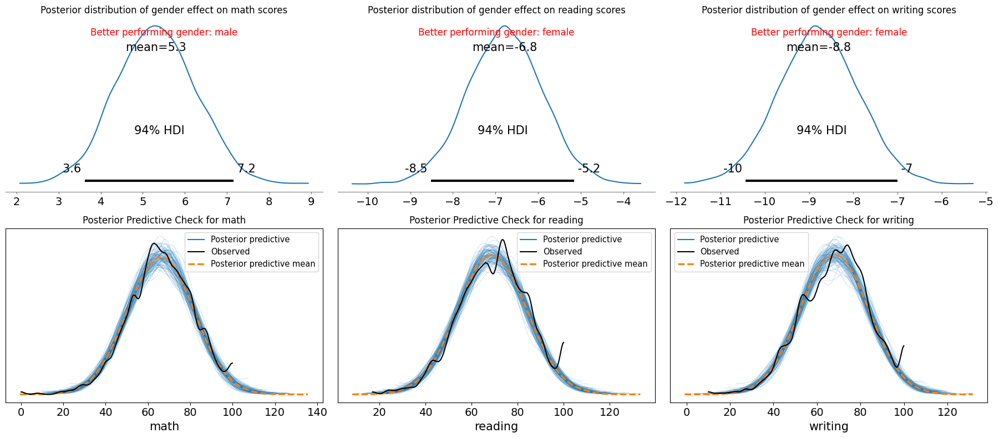

Trace for math:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/2582284854.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


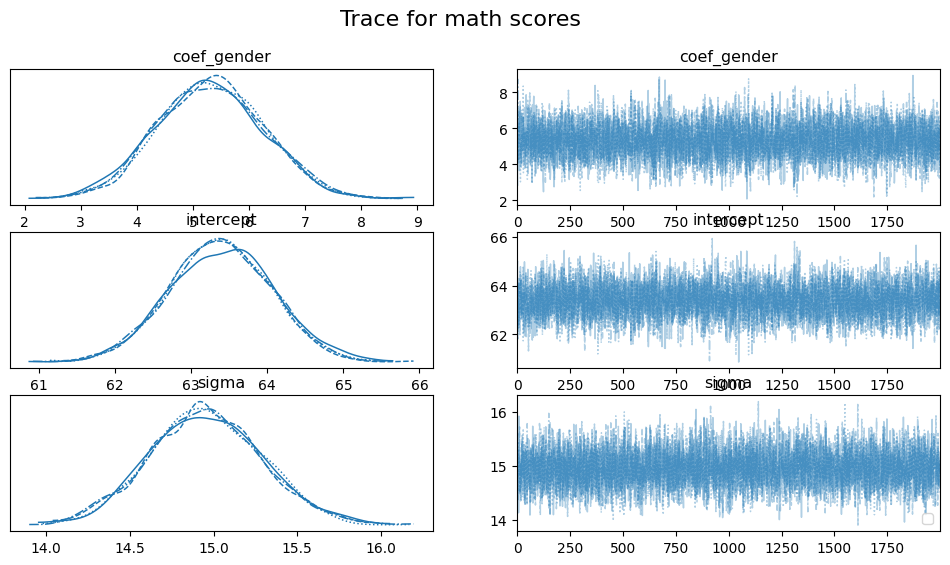

Trace for reading:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/2582284854.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


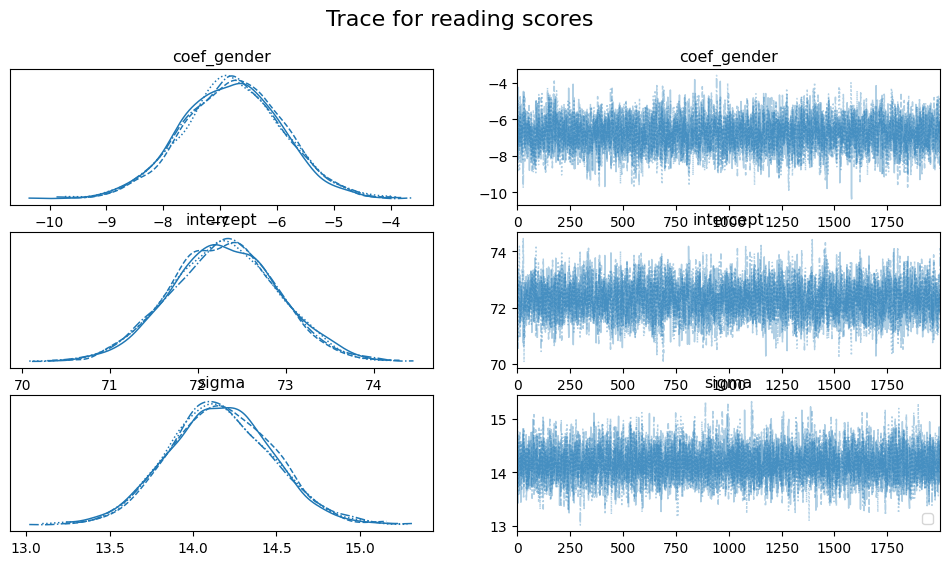

Trace for writing:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/2582284854.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


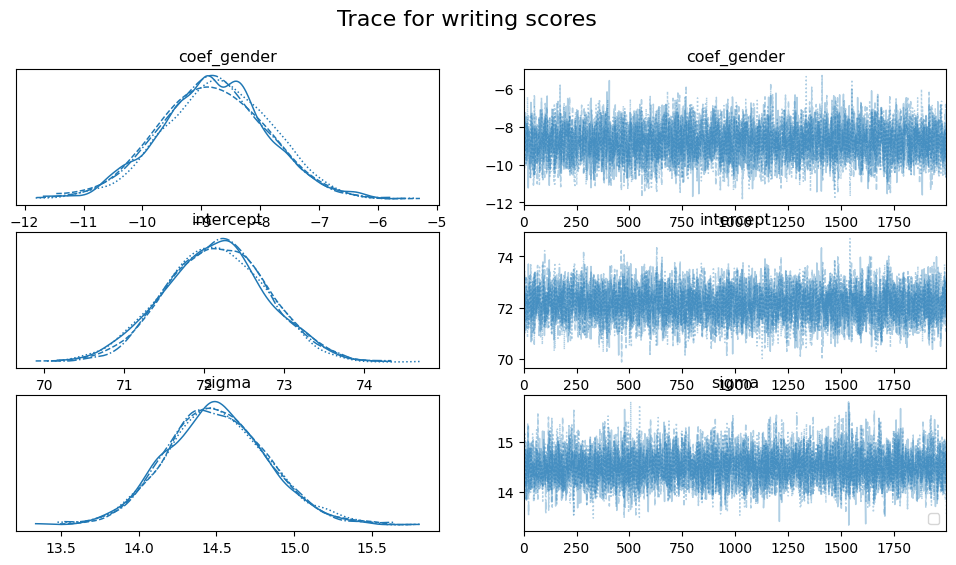

In [232]:
def compare_gender_to_test_scores():
    target_columns = ['math', 'reading', 'writing']
    traces = {}
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 8))

    for i, target_column in enumerate(target_columns):
        with pm.Model() as model:
            # Intercept
            intercept = pm.Normal('intercept', mu=0, sigma=10)

            # Priors for the coefficients
            coef_gender = pm.Normal('coef_gender', mu=0, sigma=10)

            # Standard deviation of test scores
            sigma = pm.HalfNormal('sigma', sigma=10)
            
            # Linear regression model
            mu = intercept + coef_gender * df['gender_numeric']
            
            # Likelihood of observing the data
            test_scores = pm.Normal(target_column, mu=mu, sigma=sigma, observed=df[target_column])

            trace = pm.sample(2000, return_inferencedata = True)
            
            # Store the trace
            traces[target_column] = trace

            # Extract the mean and HDI for coef_gender
            summary = az.summary(trace, var_names=['coef_gender'], hdi_prob=0.95)
            print(summary)
            mean_coef_gender = summary['mean']['coef_gender']
            hdi_2_5 = summary['hdi_2.5%']['coef_gender']
            hdi_97_5 = summary['hdi_97.5%']['coef_gender']
            
            # Determine which gender performs better
            if mean_coef_gender > 0:
                better_gender = 'male'
            else:
                better_gender = 'female'

            # Plot the posterior distribution of gender effect
            az.plot_posterior(trace, var_names=['coef_gender'], ax=axes[0, i])
            axes[0, i].set_title(f'Posterior distribution of gender effect on {target_column} scores')
            axes[0, i].annotate(f'Better performing gender: {better_gender}', 
                         xy=(0.5, 0.9), xycoords='axes fraction', 
                         ha='center', fontsize=12, color='red')

            # Posterior Predictive Checks (PPCs)
            ppc = pm.sample_posterior_predictive(trace, var_names=[target_column])

            az.plot_ppc(ppc, num_pp_samples=100, ax=axes[1, i])
            axes[1, i].set_title(f'Posterior Predictive Check for {target_column}')
            
    plt.tight_layout()
    plt.show()

    for target_column, trace in traces.items():
        print(f'Trace for {target_column}:\n')
        az.plot_trace(trace)#, var_names=['coef_lunch'])
        
        # Move the legend to the bottom right
        plt.legend(loc='lower right')
        
        plt.suptitle(f'Trace for {target_column} scores', fontsize=16)
        plt.show()

    return traces

traces = compare_gender_to_test_scores()

# Hypothesis #3 / Do Certain Race/Ethnicity Groups Perform Better Than Others?

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_demographic, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.
Sampling: [math]


Output()

                       mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
coef_demographic[0]   6.612  4.353    -1.681     15.480      0.118    0.083   
coef_demographic[1]   8.542  4.258    -0.045     16.739      0.117    0.083   
coef_demographic[2]   9.569  4.210     1.165     17.896      0.116    0.082   
coef_demographic[3]  12.417  4.224     4.170     20.864      0.116    0.082   
coef_demographic[4]  18.690  4.260    10.179     27.039      0.116    0.082   
intercept            54.832  4.156    46.397     62.862      0.116    0.082   

                     ess_bulk  ess_tail  r_hat  
coef_demographic[0]    1366.0    1910.0    1.0  
coef_demographic[1]    1319.0    1754.0    1.0  
coef_demographic[2]    1328.0    1795.0    1.0  
coef_demographic[3]    1323.0    1895.0    1.0  
coef_demographic[4]    1360.0    1998.0    1.0  
intercept              1290.0    1694.0    1.0  


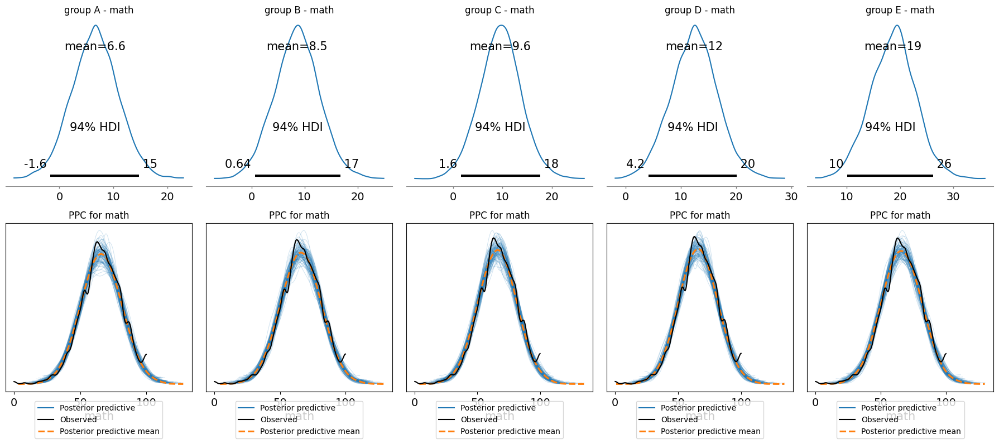

Trace for math:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/483897320.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

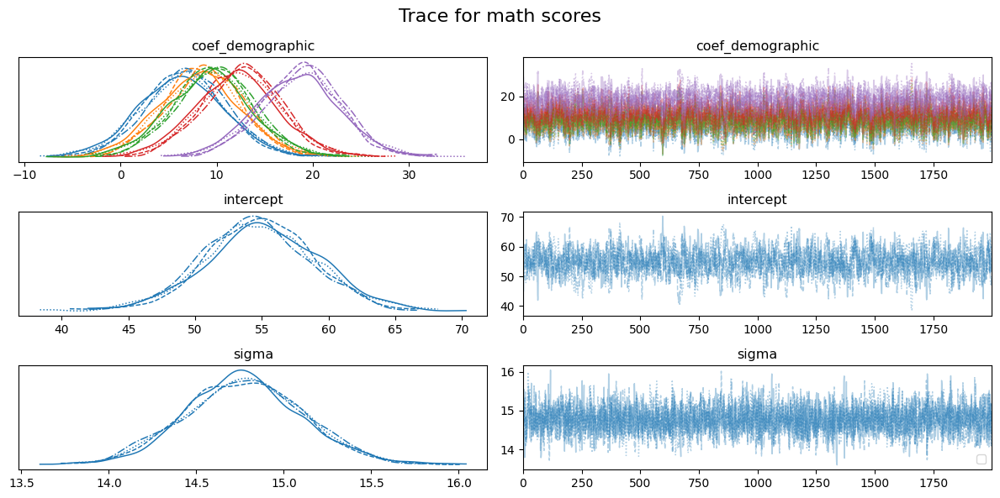

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_demographic, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.
Sampling: [reading]


Output()

                       mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
coef_demographic[0]   7.204  4.304    -1.396     15.466      0.122    0.086   
coef_demographic[1]   9.971  4.202     1.780     18.207      0.120    0.086   
coef_demographic[2]  11.744  4.178     3.749     20.158      0.122    0.086   
coef_demographic[3]  12.641  4.192     4.490     20.961      0.123    0.088   
coef_demographic[4]  15.499  4.226     7.441     24.060      0.120    0.085   
intercept            57.283  4.129    49.198     65.361      0.121    0.086   

                     ess_bulk  ess_tail  r_hat  
coef_demographic[0]    1250.0    1841.0   1.01  
coef_demographic[1]    1238.0    1765.0   1.01  
coef_demographic[2]    1179.0    1593.0   1.01  
coef_demographic[3]    1176.0    1668.0   1.01  
coef_demographic[4]    1248.0    1748.0   1.01  
intercept              1168.0    1654.0   1.01  


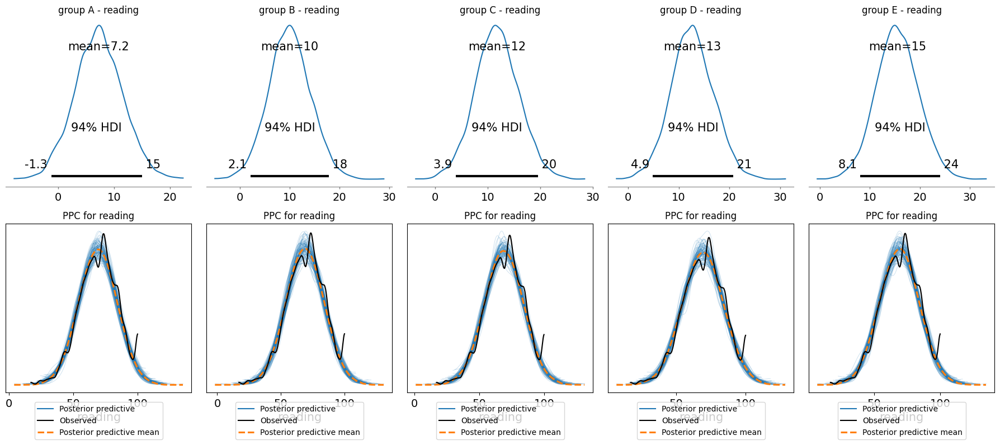

Trace for reading:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/483897320.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

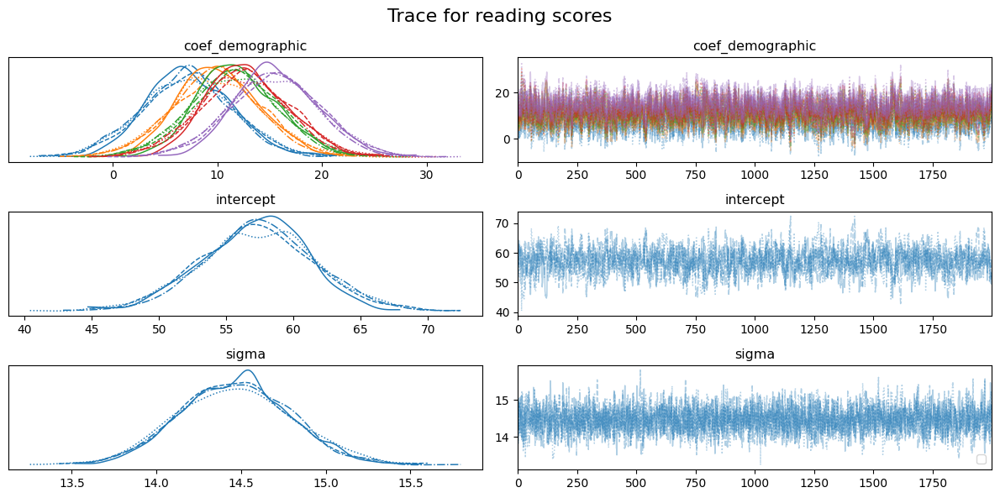

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_demographic, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.
Sampling: [writing]


Output()

                       mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
coef_demographic[0]   6.300  4.383    -2.513     14.785      0.108    0.076   
coef_demographic[1]   9.261  4.277     1.371     18.210      0.108    0.076   
coef_demographic[2]  11.551  4.247     3.095     19.783      0.109    0.077   
coef_demographic[3]  13.813  4.271     5.200     22.093      0.109    0.077   
coef_demographic[4]  14.962  4.320     6.850     23.741      0.109    0.077   
intercept            56.206  4.198    47.904     64.485      0.108    0.077   

                     ess_bulk  ess_tail  r_hat  
coef_demographic[0]    1645.0    2195.0    1.0  
coef_demographic[1]    1571.0    2168.0    1.0  
coef_demographic[2]    1520.0    2008.0    1.0  
coef_demographic[3]    1539.0    2079.0    1.0  
coef_demographic[4]    1574.0    2147.0    1.0  
intercept              1505.0    2001.0    1.0  


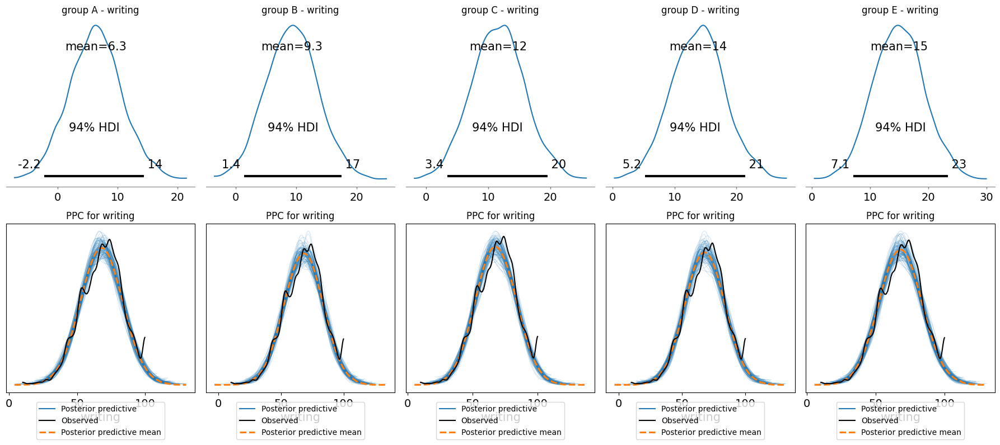

Trace for writing:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/483897320.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

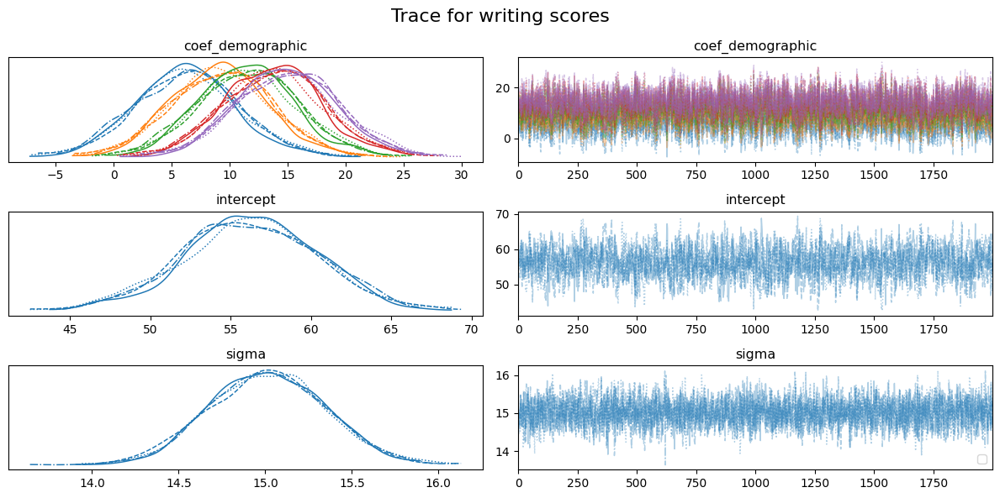

In [236]:
def compare_demographics_to_test_scores(test_area):
    traces = {}

    num_groups = df['demographic_code'].nunique()
   
    fig, axes = plt.subplots(2, num_groups, figsize=(18, 8))

    with pm.Model() as model:
        # Intercept
        intercept = pm.Normal('intercept', mu=0, sigma=10)

        # Priors for the coefficients
        coef_demographic = pm.Normal('coef_demographic', mu=0, sigma=10, shape=num_groups)

        # Standard deviation of test scores
        sigma = pm.HalfNormal('sigma', sigma=10)
        
        # Linear regression model
        demographic_indices = df['demographic_code']
        mu = intercept + coef_demographic[demographic_indices]
        
        # Likelihood of observing the data
        test_scores = pm.Normal(test_area, mu=mu, sigma=sigma, observed=df[test_area])

        trace = pm.sample(2000, return_inferencedata=True)
        
        # Store the trace
        traces[test_area] = trace

        # Extract the mean and HDI for coef_demographic
        summary = az.summary(trace, var_names=['coef_demographic', 'intercept'], hdi_prob=0.95)
        print(summary)

        # Plot the posterior distribution of demographics effect
        for j in range(num_groups):
            az.plot_posterior(trace, var_names=['coef_demographic'], coords={'coef_demographic_dim_0': [j]}, ax=axes[0, j])
            axes[0, j].set_title(f'{demographic_mapping[j]} - {test_area}')

        # Posterior Predictive Checks (PPCs)
        ppc = pm.sample_posterior_predictive(trace, var_names=[test_area])

        # plot PPCs
        for j in range(num_groups):
            az.plot_ppc(ppc, num_pp_samples=100, ax=axes[1, j])
            axes[1, j].set_title(f'PPC for {test_area}')
            axes[1, j].legend(loc='lower center', bbox_to_anchor=(0.5, -0.3))

    plt.tight_layout()
    plt.show()

    for target_column, trace in traces.items():
        print(f'Trace for {target_column}:\n')
        plt.figure()
        az.plot_trace(trace)
        
        # Move the legend to the bottom right
        plt.legend(loc='lower right')
        plt.suptitle(f'Trace for {target_column} scores', fontsize=16)
        plt.tight_layout()
        plt.show()

    return traces

# Example usage:
traces = compare_demographics_to_test_scores('math')
traces = compare_demographics_to_test_scores('reading')
traces = compare_demographics_to_test_scores('writing')

# Hypothesis #4 / Are There Socioeconomic Disparities in Test Scores?

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_lunch, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [math]


Output()

              mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
coef_lunch  11.377  0.913     9.516     13.122      0.013    0.009    4789.0   

            ess_tail  r_hat  
coef_lunch    5114.0    1.0  


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_lunch, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [reading]


Output()

             mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
coef_lunch  7.289  0.933     5.423      9.079      0.014     0.01    4589.0   

            ess_tail  r_hat  
coef_lunch    4604.0    1.0  


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_lunch, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Sampling: [writing]


Output()

             mean    sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
coef_lunch  8.108  0.95     6.218      9.971      0.015     0.01    4196.0   

            ess_tail  r_hat  
coef_lunch    4262.0    1.0  


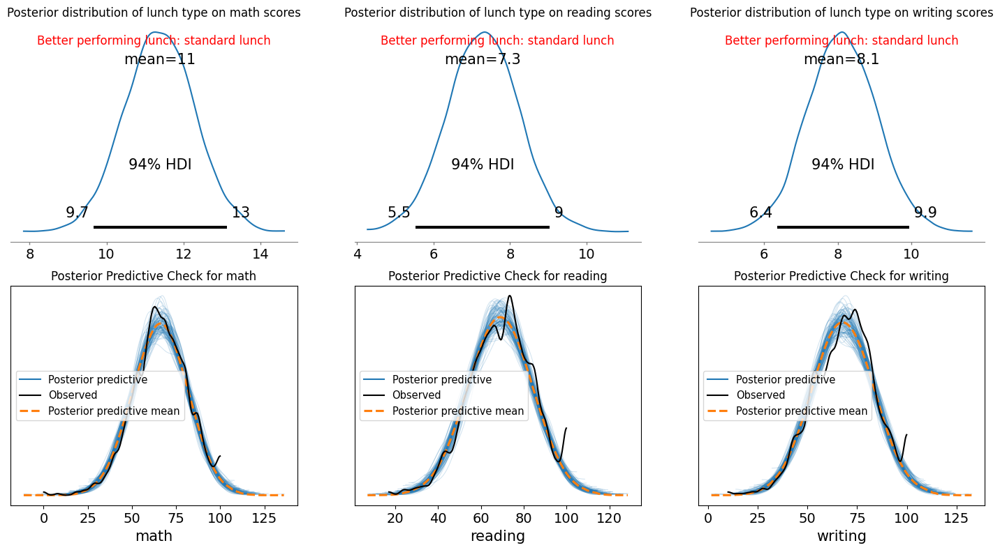

Trace for math:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/3914559764.py:62: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

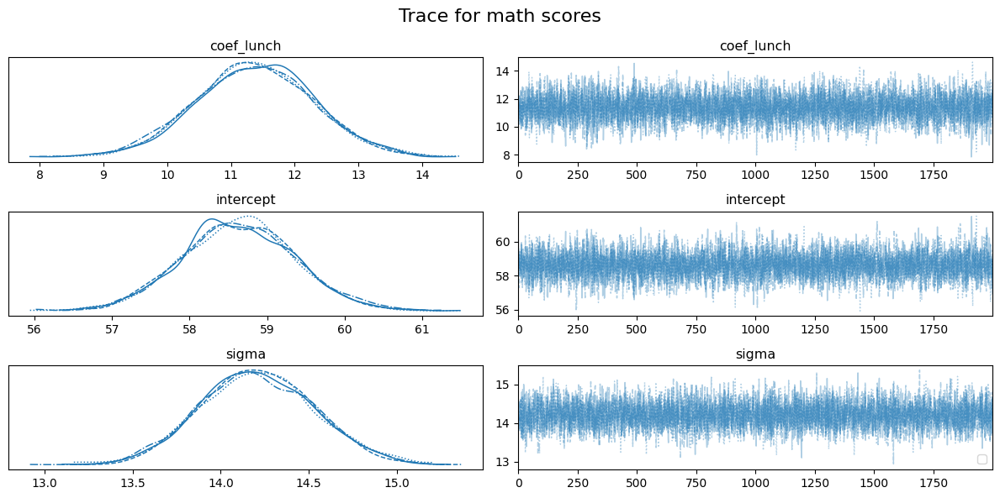

Trace for reading:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/3914559764.py:62: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

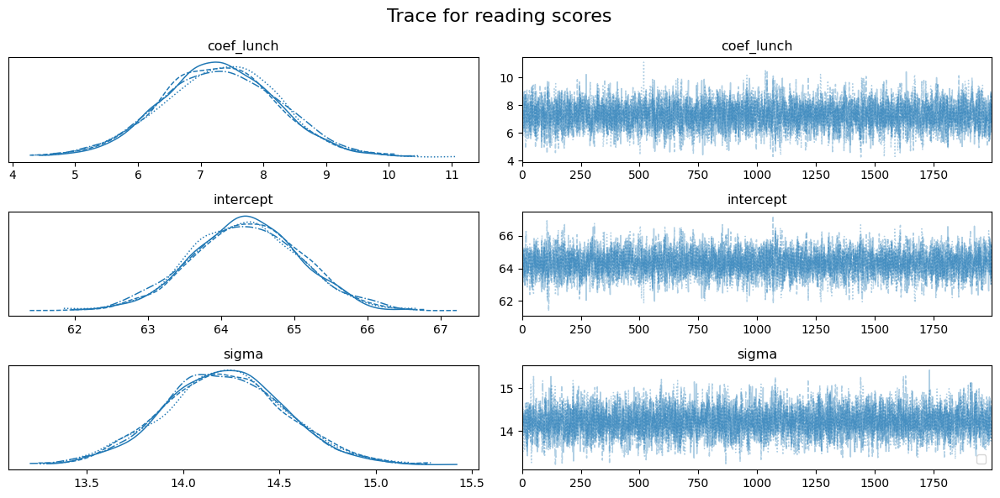

Trace for writing:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/3914559764.py:62: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

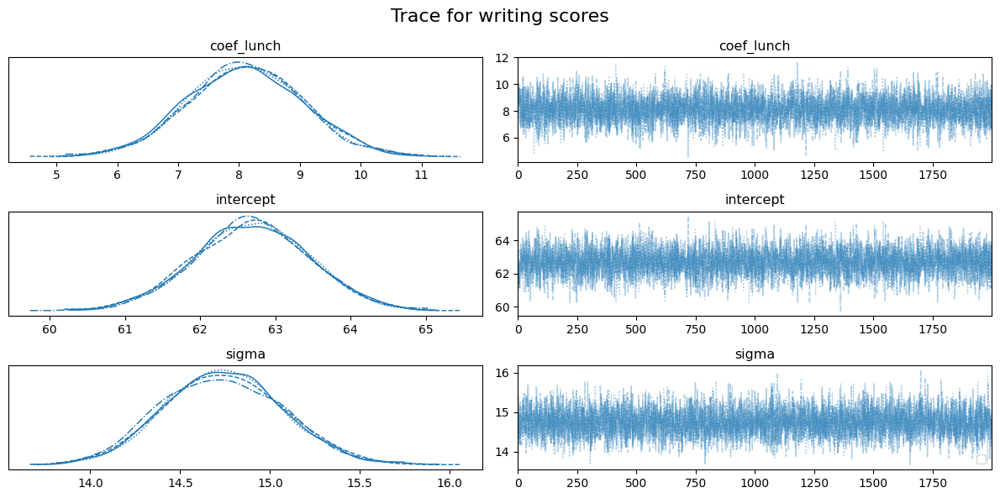

In [234]:
def compare_lunch_type_to_test_scores():
    target_columns = ['math', 'reading', 'writing']
    traces = {}
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 9))

    for i, target_column in enumerate(target_columns):
        with pm.Model() as model:
            # Intercept
            intercept = pm.Normal('intercept', mu=0, sigma=10)

            # Priors for the coefficients
            coef_lunch = pm.Normal('coef_lunch', mu=0, sigma=10)

            # Standard deviation of test scores
            sigma = pm.HalfNormal('sigma', sigma=10)
            
            # Linear regression model
            mu = intercept + coef_lunch * df['lunch_numeric']
            
            # Likelihood of observing the data
            test_scores = pm.Normal(target_column, mu=mu, sigma=sigma, observed=df[target_column])

            trace = pm.sample(2000, return_inferencedata = True)
            
            # Store the trace
            traces[target_column] = trace

            # Extract the mean and HDI for coef_lunch
            summary = az.summary(trace, var_names=['coef_lunch'], hdi_prob=0.95)
            print(summary)

            mean_coef_lunch = summary['mean']['coef_lunch']

            if mean_coef_lunch > 0:
                better_group = 'standard lunch'
            else:
                better_group = 'discount lunch'

            # Plot the posterior distribution of gender effect
            az.plot_posterior(trace, var_names=['coef_lunch'], ax=axes[0, i])
            axes[0, i].set_title(f'Posterior distribution of lunch type on {target_column} scores')
            axes[0, i].annotate(f'Better performing lunch: {better_group}', 
                         xy=(0.5, 0.9), xycoords='axes fraction', 
                         ha='center', fontsize=12, color='red')

            # Posterior Predictive Checks (PPCs)
            ppc = pm.sample_posterior_predictive(trace, var_names=[target_column])

            az.plot_ppc(ppc, num_pp_samples=100, ax=axes[1, i])
            axes[1, i].set_title(f'Posterior Predictive Check for {target_column}')


    plt.show()
    
    for target_column, trace in traces.items():
        print(f'Trace for {target_column}:\n')
        plt.figure()
        az.plot_trace(trace)
        
        # Move the legend to the bottom right
        plt.legend(loc='lower right')
        plt.suptitle(f'Trace for {target_column} scores', fontsize=16)
        plt.tight_layout()
        plt.show()

    return traces

traces = compare_lunch_type_to_test_scores()

# Hypothesis #5 / Does a Parent's Education Play an Important Role in Student Test Scores?

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_parent_education, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.
Sampling: [math]


Output()

                            mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
coef_parent_education[0]   6.635  3.855    -0.931     14.269      0.099   
coef_parent_education[1]   5.303  3.824    -2.250     12.739      0.099   
coef_parent_education[2]  10.255  3.822     2.737     17.838      0.099   
coef_parent_education[3]  11.008  3.840     3.613     18.846      0.099   
coef_parent_education[4]  12.375  3.890     4.422     19.954      0.099   
coef_parent_education[5]  12.495  4.094     4.706     20.823      0.102   
intercept                 56.776  3.741    49.373     64.265      0.099   

                          mcse_sd  ess_bulk  ess_tail  r_hat  
coef_parent_education[0]    0.070    1514.0    1677.0    1.0  
coef_parent_education[1]    0.070    1493.0    1684.0    1.0  
coef_parent_education[2]    0.070    1497.0    1672.0    1.0  
coef_parent_education[3]    0.070    1496.0    1792.0    1.0  
coef_parent_education[4]    0.070    1550.0    1840.0    1.0  
coef_parent_education

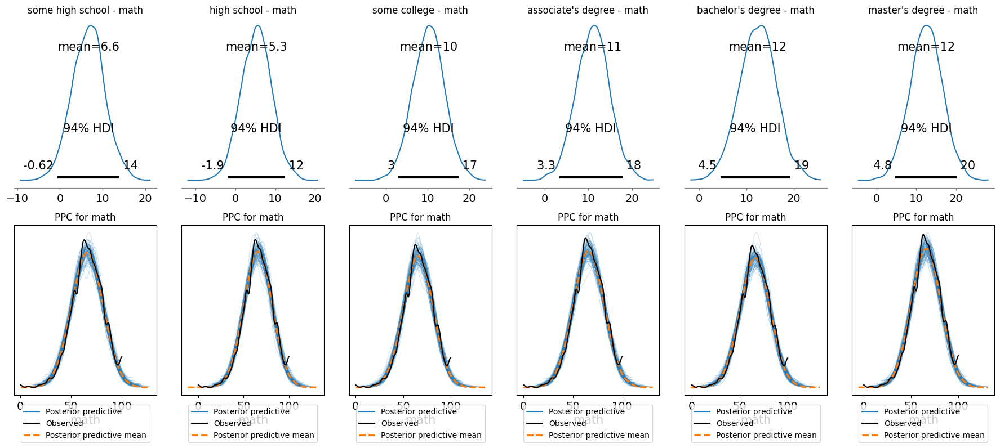

Trace for math:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/3556569583.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

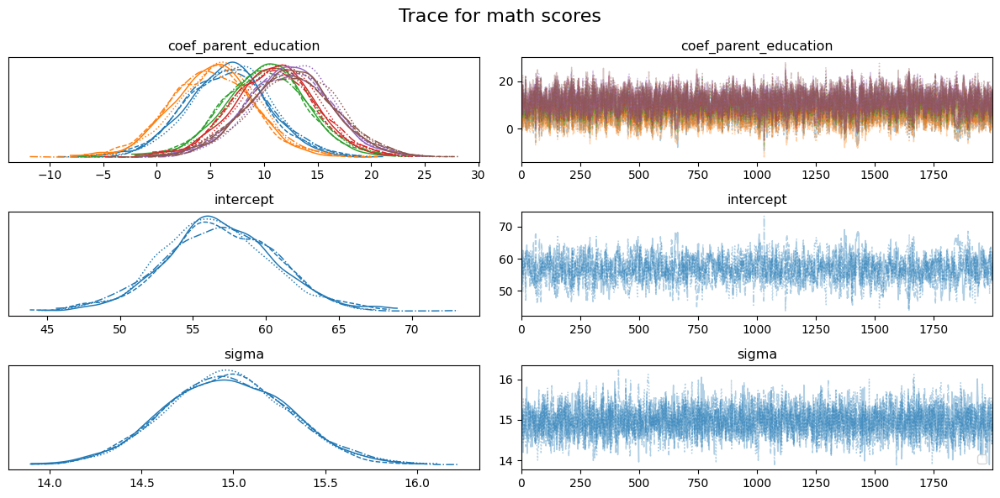

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_parent_education, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 6 seconds.
Sampling: [reading]


Output()

                            mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
coef_parent_education[0]   6.973  4.014    -1.241     14.579      0.114   
coef_parent_education[1]   4.750  4.029    -3.072     12.674      0.116   
coef_parent_education[2]   9.489  4.021     2.145     17.884      0.116   
coef_parent_education[3]  10.937  4.023     3.358     19.173      0.115   
coef_parent_education[4]  12.871  4.078     5.219     21.214      0.115   
coef_parent_education[5]  14.968  4.220     7.032     23.432      0.115   
intercept                 59.888  3.925    51.726     67.087      0.114   

                          mcse_sd  ess_bulk  ess_tail  r_hat  
coef_parent_education[0]    0.086    1240.0    1349.0    1.0  
coef_parent_education[1]    0.088    1207.0    1295.0    1.0  
coef_parent_education[2]    0.086    1207.0    1376.0    1.0  
coef_parent_education[3]    0.085    1234.0    1427.0    1.0  
coef_parent_education[4]    0.084    1260.0    1398.0    1.0  
coef_parent_education

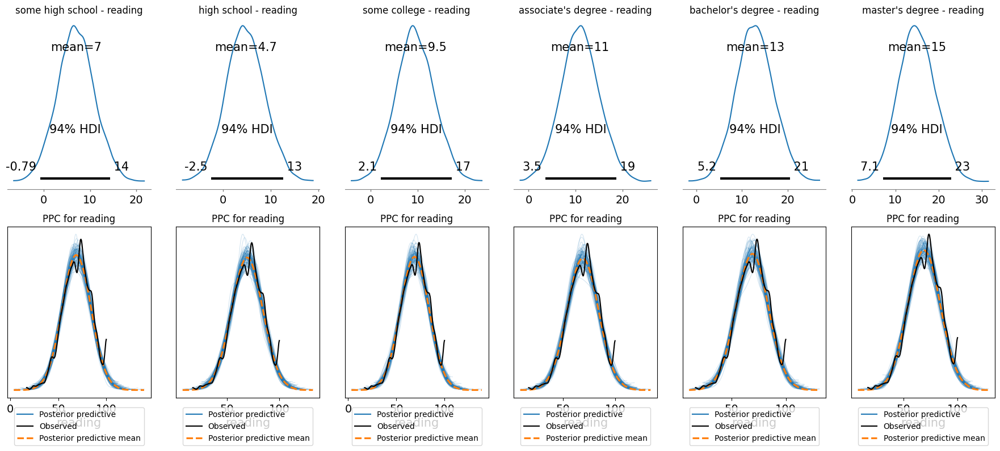

Trace for reading:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/3556569583.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

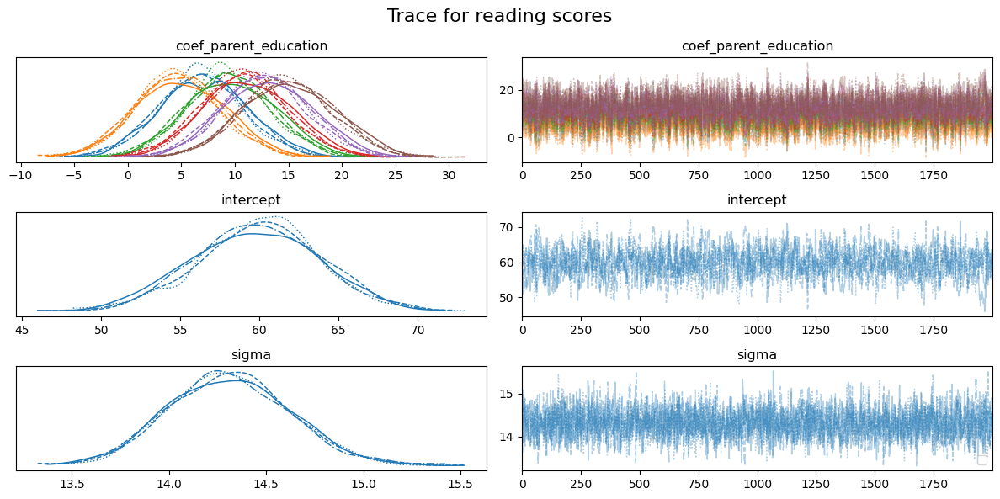

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_parent_education, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.
Sampling: [writing]


Output()

                            mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  \
coef_parent_education[0]   5.417  3.855    -2.115     12.982      0.105   
coef_parent_education[1]   3.005  3.867    -4.295     10.721      0.106   
coef_parent_education[2]   9.345  3.852     2.027     16.804      0.105   
coef_parent_education[3]  10.401  3.834     2.640     17.503      0.104   
coef_parent_education[4]  13.732  3.929     6.189     21.389      0.106   
coef_parent_education[5]  15.690  4.062     8.032     23.765      0.108   
intercept                 59.398  3.756    52.024     66.611      0.106   

                          mcse_sd  ess_bulk  ess_tail  r_hat  
coef_parent_education[0]    0.074    1359.0    2088.0    1.0  
coef_parent_education[1]    0.075    1327.0    1947.0    1.0  
coef_parent_education[2]    0.074    1341.0    2009.0    1.0  
coef_parent_education[3]    0.074    1350.0    2109.0    1.0  
coef_parent_education[4]    0.075    1370.0    2121.0    1.0  
coef_parent_education

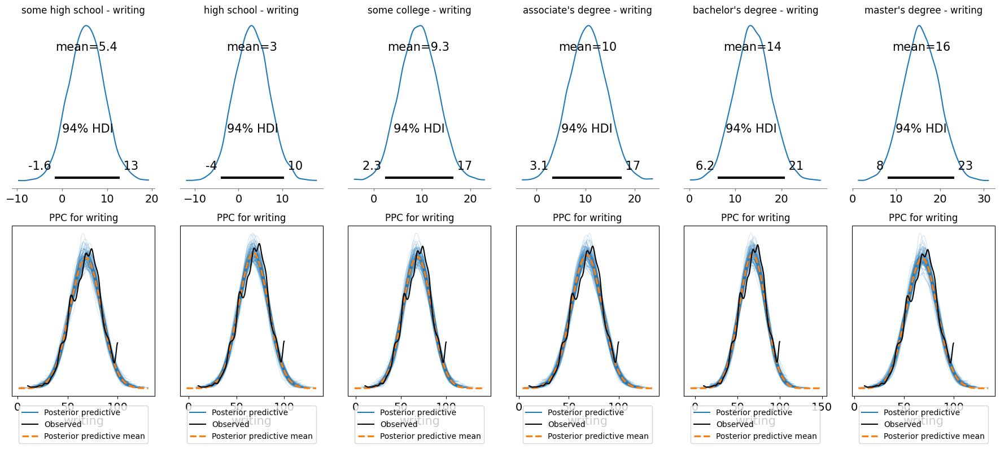

Trace for writing:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/3556569583.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

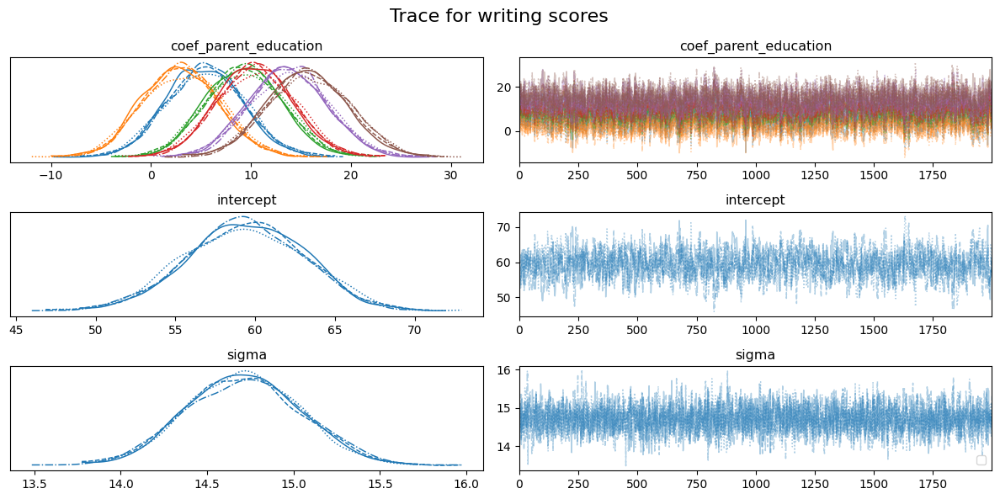

In [253]:
def compare_parent_education_to_test_scores(test_area):
    traces = {}

    num_groups = df['parent_edu_code'].nunique()
   
    fig, axes = plt.subplots(2, num_groups, figsize=(18, 8))

    with pm.Model() as model:
        # Intercept
        intercept = pm.Normal('intercept', mu=0, sigma=10)

        # Priors for the coefficients
        coef_parent_education = pm.Normal('coef_parent_education', mu=0, sigma=10, shape=num_groups)

        # Standard deviation of test scores
        sigma = pm.HalfNormal('sigma', sigma=10)
        
        # Linear regression model
        parent_education_indices = df['parent_edu_code']
        mu = intercept + coef_parent_education[parent_education_indices]
        
        # Likelihood of observing the data
        test_scores = pm.Normal(test_area, mu=mu, sigma=sigma, observed=df[test_area])

        trace = pm.sample(2000, return_inferencedata=True)
        
        # Store the trace
        traces[test_area] = trace

        # Extract the mean and HDI for coef_parent_education
        summary = az.summary(trace, var_names=['coef_parent_education', 'intercept'], hdi_prob=0.95)
        print(summary)

        # Plot the posterior distribution of parent's education effect
        for j in range(num_groups):
            az.plot_posterior(trace, var_names=['coef_parent_education'], coords={'coef_parent_education_dim_0': [j]}, ax=axes[0, j])
            axes[0, j].set_title(f'{parent_edu_mapping[j]} - {test_area}')

        # Posterior Predictive Checks (PPCs)
        ppc = pm.sample_posterior_predictive(trace, var_names=[test_area])

        # plot PPCs
        for j in range(num_groups):
            az.plot_ppc(ppc, num_pp_samples=100, ax=axes[1, j])
            axes[1, j].set_title(f'PPC for {test_area}')
            axes[1, j].legend(loc='lower center', bbox_to_anchor=(0.5, -0.3))

    plt.tight_layout()
    plt.show()

    for target_column, trace in traces.items():
        print(f'Trace for {target_column}:\n')
        plt.figure()
        az.plot_trace(trace)
        
        # Move the legend to the bottom right
        plt.legend(loc='lower right')
        plt.suptitle(f'Trace for {target_column} scores', fontsize=16)
        plt.tight_layout()
        plt.show()

    return traces

traces = compare_parent_education_to_test_scores('math')
traces = compare_parent_education_to_test_scores('reading')
traces = compare_parent_education_to_test_scores('writing')

# Hypothesis #6 - Is There an Effect Between Test Prep and Socioeconomic Status on Student Performance?

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_test_prep, coef_lunch, coef_interaction, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.


                    mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
coef_test_prep     6.750  1.490     3.904      9.726      0.027    0.019   
coef_lunch        11.912  1.141     9.661     14.118      0.021    0.015   
coef_interaction  -1.279  1.861    -4.901      2.392      0.032    0.023   
intercept         56.167  0.919    54.383     57.966      0.017    0.012   

                  ess_bulk  ess_tail  r_hat  
coef_test_prep      3120.0    4053.0    1.0  
coef_lunch          3016.0    4391.0    1.0  
coef_interaction    3311.0    4480.0    1.0  
intercept           2988.0    4390.0    1.0  


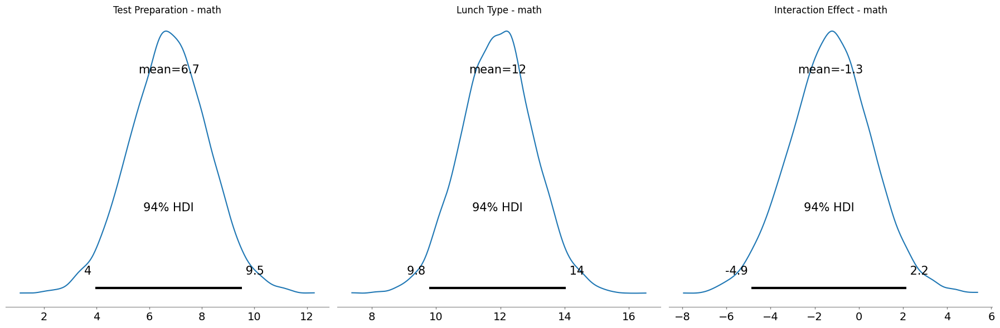

Trace for math:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/2057816328.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

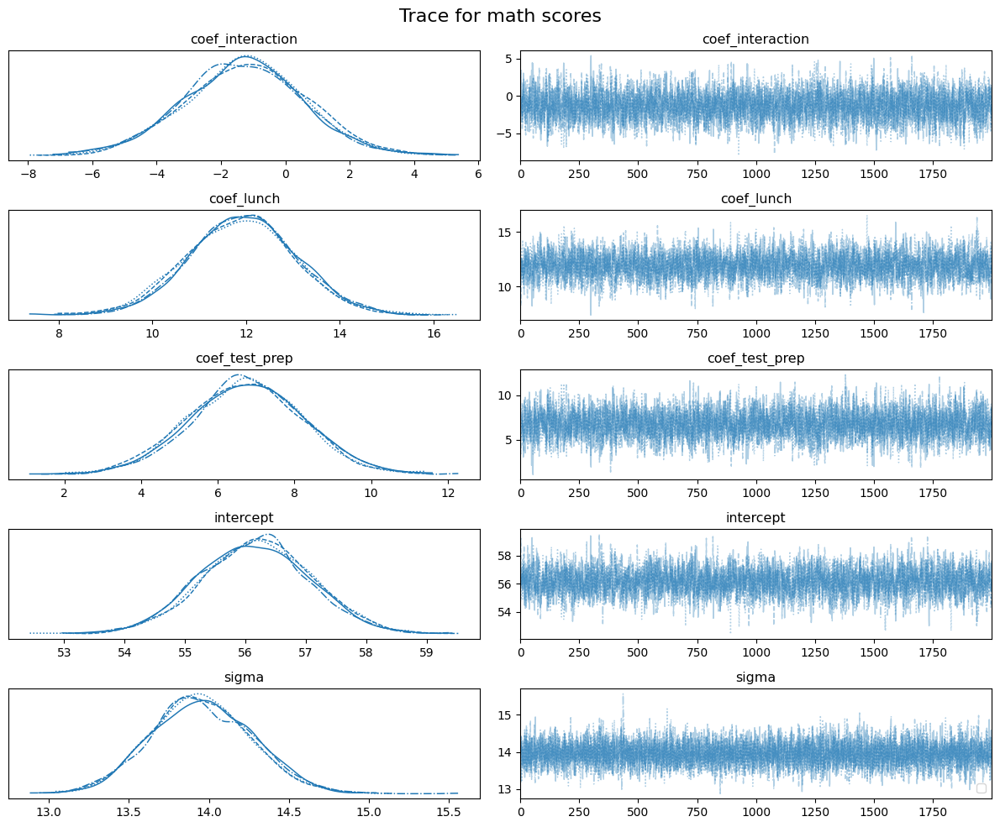

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_test_prep, coef_lunch, coef_interaction, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.


                    mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
coef_test_prep     8.494  1.482     5.679     11.473      0.027    0.019   
coef_lunch         7.906  1.113     5.738     10.081      0.020    0.014   
coef_interaction  -1.419  1.843    -5.005      2.186      0.035    0.025   
intercept         61.228  0.901    59.430     62.974      0.016    0.011   

                  ess_bulk  ess_tail  r_hat  
coef_test_prep      2932.0    4824.0    1.0  
coef_lunch          3109.0    4139.0    1.0  
coef_interaction    2832.0    4704.0    1.0  
intercept           3198.0    4447.0    1.0  


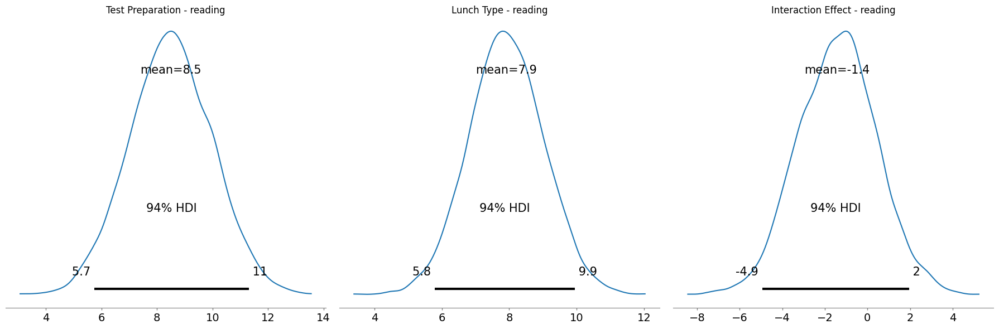

Trace for reading:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/2057816328.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

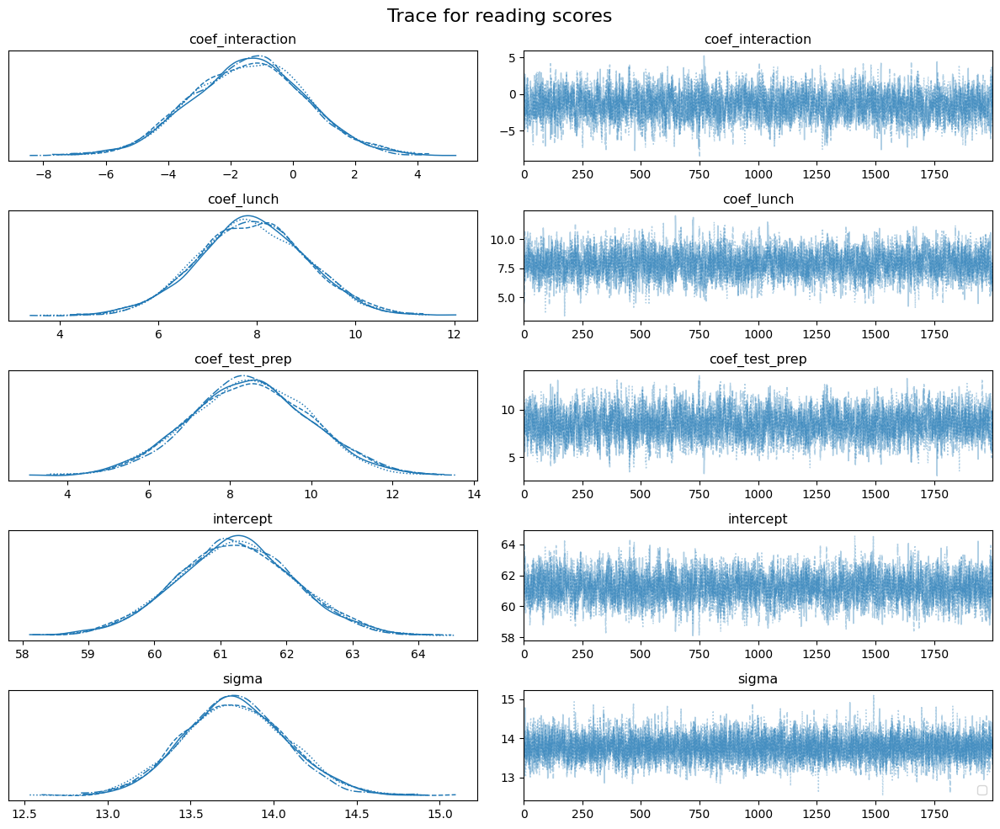

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, coef_test_prep, coef_lunch, coef_interaction, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.


                    mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
coef_test_prep    11.678  1.509     8.753     14.610      0.028    0.020   
coef_lunch         9.088  1.151     6.836     11.329      0.021    0.015   
coef_interaction  -2.428  1.887    -5.981      1.443      0.034    0.024   
intercept         58.441  0.923    56.652     60.253      0.017    0.012   

                  ess_bulk  ess_tail  r_hat  
coef_test_prep      2943.0    4182.0    1.0  
coef_lunch          3083.0    4063.0    1.0  
coef_interaction    3010.0    4040.0    1.0  
intercept           3096.0    4053.0    1.0  


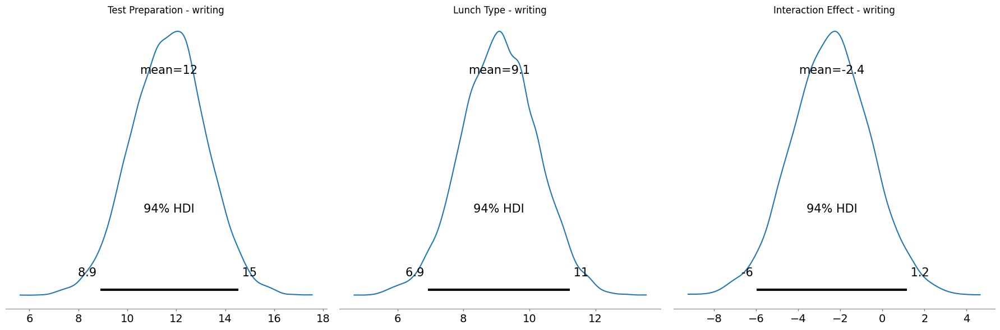

Trace for writing:



/var/folders/0v/80zxmry158l85b2sy7ywwj5w0000gn/T/ipykernel_95383/2057816328.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 0 Axes>

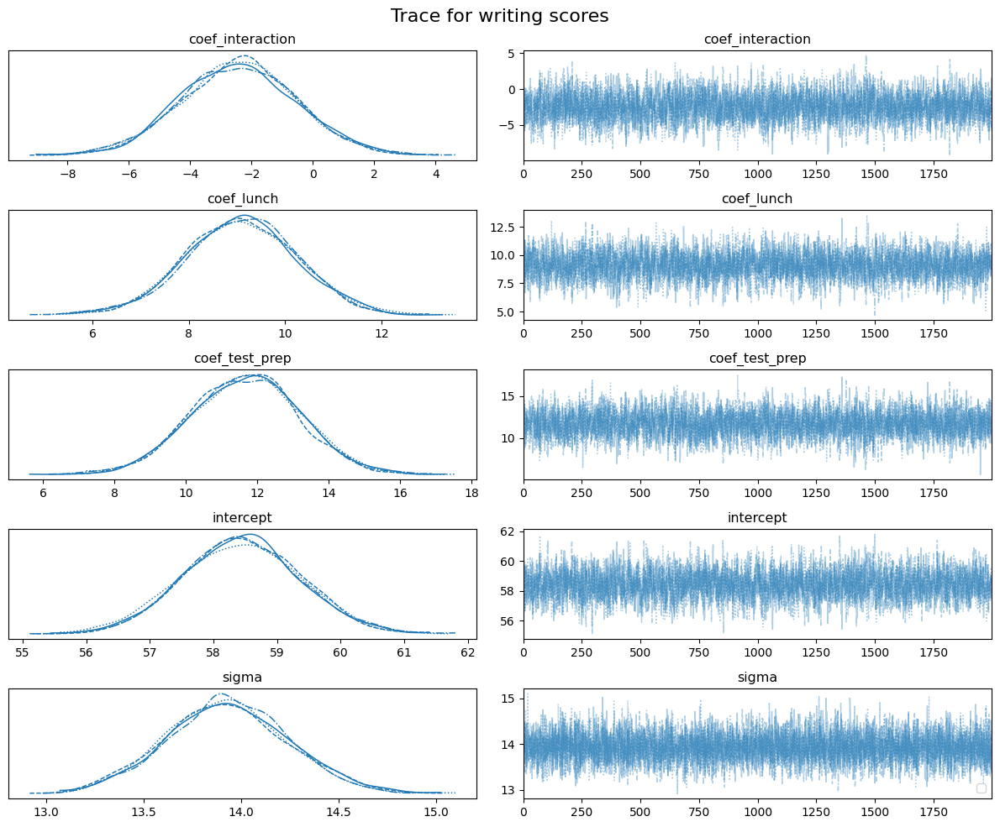

In [258]:
def compare_test_prep_and_lunch_interaction_bayesian(test_area):
    traces = {}

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    with pm.Model() as model:
        # Intercept
        intercept = pm.Normal('intercept', mu=0, sigma=10)

        # Priors for the coefficients
        coef_test_prep = pm.Normal('coef_test_prep', mu=0, sigma=10)
        coef_lunch = pm.Normal('coef_lunch', mu=0, sigma=10)
        coef_interaction = pm.Normal('coef_interaction', mu=0, sigma=10)

        # Standard deviation of test scores
        sigma = pm.HalfNormal('sigma', sigma=10)
        
        # Linear regression model
        mu = (intercept + 
              coef_test_prep * df['test_prep_numeric'] + 
              coef_lunch * df['lunch_numeric'] + 
              coef_interaction * df['test_prep_numeric'] * df['lunch_numeric'])
        
        # Likelihood of observing the data
        test_scores = pm.Normal(test_area, mu=mu, sigma=sigma, observed=df[test_area])

        trace = pm.sample(2000, return_inferencedata=True)
        
        # Store the trace
        traces[test_area] = trace

        # Extract the mean and HDI for coef_test_prep, coef_lunch, and coef_interaction
        summary = az.summary(trace, var_names=['coef_test_prep', 'coef_lunch', 'coef_interaction', 'intercept'], hdi_prob=0.95)
        print(summary)

        # Plot the posterior distribution of test preparation effect
        az.plot_posterior(trace, var_names=['coef_test_prep'], ax=axes[0])
        axes[0].set_title(f'Test Preparation - {test_area}')

        # Plot the posterior distribution of lunch effect
        az.plot_posterior(trace, var_names=['coef_lunch'], ax=axes[1])
        axes[1].set_title(f'Lunch Type - {test_area}')

        # Plot the posterior distribution of interaction effect
        az.plot_posterior(trace, var_names=['coef_interaction'], ax=axes[2])
        axes[2].set_title(f'Interaction Effect - {test_area}')

    plt.tight_layout()
    plt.show()

    for target_column, trace in traces.items():
        print(f'Trace for {target_column}:\n')
        plt.figure()
        az.plot_trace(trace)
        
        # Move the legend to the bottom right
        plt.legend(loc='lower right')
        plt.suptitle(f'Trace for {target_column} scores', fontsize=16)
        plt.tight_layout()
        plt.show()

    return traces

# Run the new function for each test area
traces_test_prep_lunch_interaction = compare_test_prep_and_lunch_interaction_bayesian('math')
traces_test_prep_lunch_interaction = compare_test_prep_and_lunch_interaction_bayesian('reading')
traces_test_prep_lunch_interaction = compare_test_prep_and_lunch_interaction_bayesian('writing')